In [23]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import tensorflow.compat.v1 as tf

In [138]:
data = torch.load('/home/raquelpanadero/Desktop/TFG/waymo_dataset_images/segments/segments.pt')

In [144]:
index = 0

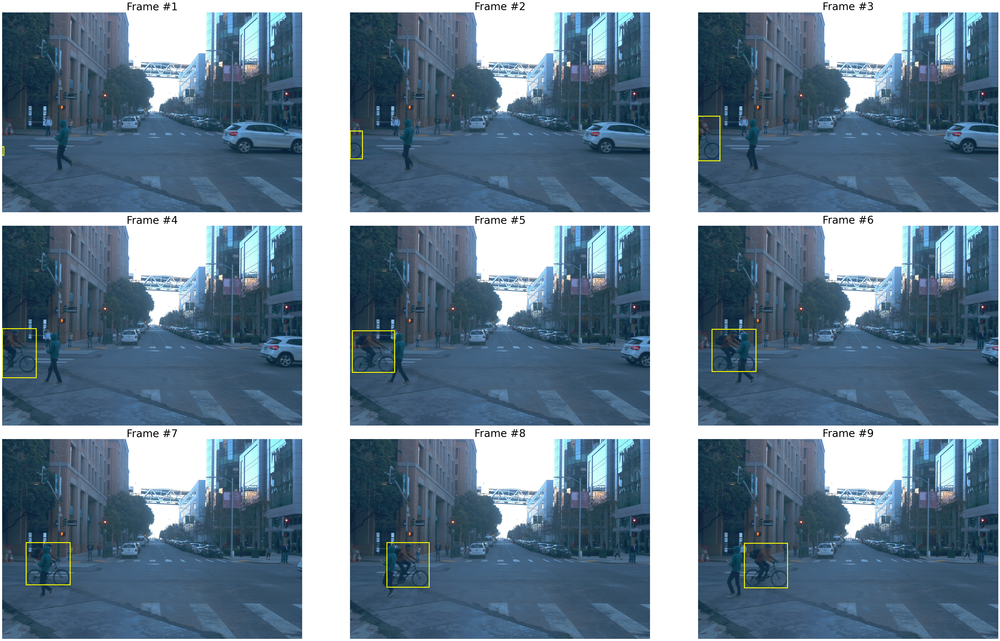

In [145]:
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(50, 30))

first_index = 0

for i in range(9):
    ax[i//3, i%3].imshow(tf.image.decode_jpeg(data[index]['images'][first_index+i]))
    coords = data[index]['coords'][first_index+i]


    ax[i//3, i%3].add_patch(
        patches.Rectangle(
            xy=(
                1920 * (coords[0] - 0.5 * coords[2]),
                1920 * (coords[1] - 0.5 * coords[3]),
            ),
            width=coords[2] * 1920,
            height=coords[3] * 1920,
            linewidth=3,
            edgecolor='yellow',
            facecolor='none'
        )
    )
    ax[i//3, i%3].set_title(f'Frame #{i+1}', fontsize=35)
    ax[i//3, i%3].axis('off')

plt.tight_layout()
plt.show()

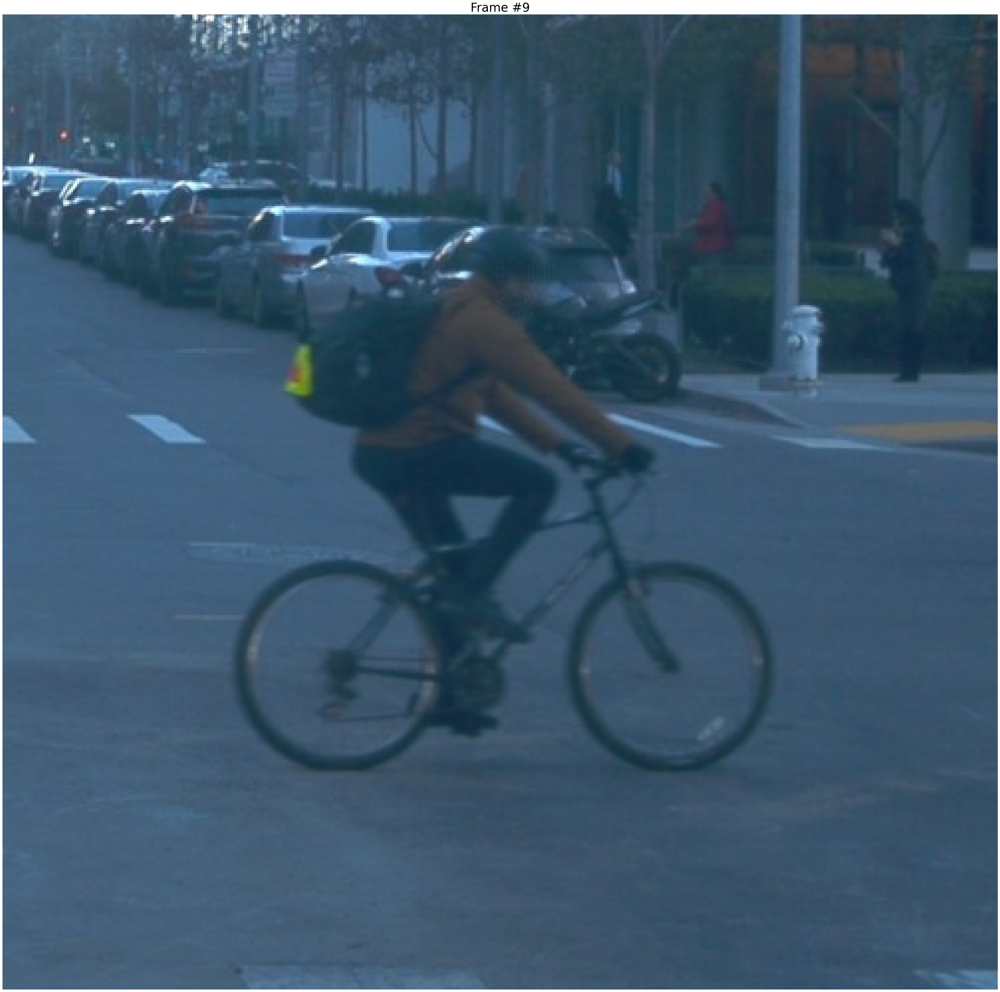

In [148]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(50, 40))

first_index = 12

ax.imshow(tf.image.decode_jpeg(data[index]['images'][first_index+i]))
coords = data[index]['coords'][first_index+i]

ax.set_xlim((int(1920 * (coords[0] - 0.5 * coords[2]) - 110), int(1920 * (coords[0] + 0.5 * coords[2]) + 110)))
ax.set_ylim((int(1920 * (coords[1] + 0.5 * coords[3]) + 110), int(1920 * (coords[1] - 0.5 * coords[3]) - 110)))

ax.set_title(f'Frame #{i+1}', fontsize=35)
ax.axis('off')

plt.tight_layout()
plt.show()

In [60]:
def make_video(index, videoname, paint=False):
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    video = cv2.VideoWriter(f'/home/raquelpanadero/Desktop/TFG/videos/{videoname}', fourcc, 10, (1920,1280))

    for image, coords in zip(data[index]['images'], data[index]['coords']):
        img = tf.image.decode_jpeg(image).numpy()
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        if paint:
            start_point = (
                int(1920 * (coords[0] - 0.5 * coords[2])),
                int(1920 * (coords[1] - 0.5 * coords[3]))
            )
            end_point = (
                int(1920 * (coords[0] + 0.5 * coords[2])),
                int(1920 * (coords[1] + 0.5 * coords[3]))
            )
            img_rgb = cv2.rectangle(img_rgb, start_point, end_point, (0, 255, 255), 2)
        
        video.write(img_rgb)

    cv2.destroyAllWindows()
    video.release()

In [128]:
index = 5
make_video(index, 'output.mp4', True)